# Portfolio for SDSPhD20

This notebook contains the exercises and assignments to be answered in a portfolio for the PhD course "Social Data Science: An Applied Introduction to Machine Learning" at Aalborg University, November 2020.

Each day of the course you are given an hour to work on a portfolio with the possibility of sparring with the course lecturers. 

You are expected to attempt to solve the various assignments using the methods and tools taught during the course. Answers should be combined into a notebook (fx by adding answers to a copy of this one). 

**Note:** You are not expected to attempt to solve every single assignment. Note the different requirements for each day.

#### How to hand in your portfolio notebooks

You can hand in your portfolio notebooks in two ways:

- Saving your notebooks in a GitHub repository and then sending the repository URL to the course organizer (Kristian Kjelmann)
- Sharing your notebooks directly with the course organizer (Kristian Kjelmann) in Google Colab.

Kristian’s e-mail: kgk@adm.aau.dk



# Portfolio assignments for Tuesday (unsupervised and supervised machine learning)

**Requirement**: Work on solutions for *either* "unsupervised machine learning with penguins" or "clustering" *and* *either* "supervised machine learning with penguins" or "employee turnover".

### The assignment

1. Inspect the data with some of the standard functions you learned so far (desc, info etc.). What do we have here?
2. Likewise, use some standard visualizations (eg. from seaborn) to express some properties of the data
3. Create a new dataset where you scale all numeric values with the standardscaler.
4. Perform a PCA analysis
5. Investigate the explained variance of the components... do we see an 'elbow'?
5. Plot the data in the space of the first two components. Maybe color it by species or island. What pattern do we see?
6. Inspect the correlation between the components. Which variables are they mostly associated with?

#### Data and libraries

In [ ]:
# standard packaging

import pandas as pd
import seaborn as sns
sns.set(color_codes=True, rc={'figure.figsize':(10,8)})

from IPython.display import HTML #Youtube embed

In [ ]:
penguins = pd.read_csv("https://github.com/allisonhorst/palmerpenguins/raw/5b5891f01b52ae26ad8cb9755ec93672f49328a8/data/penguins_size.csv")

In [ ]:
penguins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species_short      344 non-null    object 
 1   island             344 non-null    object 
 2   culmen_length_mm   342 non-null    float64
 3   culmen_depth_mm    342 non-null    float64
 4   flipper_length_mm  342 non-null    float64
 5   body_mass_g        342 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 18.9+ KB


In [ ]:
penguins.head()

,species_short,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE


In [ ]:
penguins.describe()

,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g
count,342.000000,342.000000,342.000000,342.000000
mean,43.921930,17.151170,200.915205,4201.754386
std,5.459584,1.974793,14.061714,801.954536
min,32.100000,13.100000,172.000000,2700.000000
25%,39.225000,15.600000,190.000000,3550.000000
50%,44.450000,17.300000,197.000000,4050.000000
75%,48.500000,18.700000,213.000000,4750.000000
max,59.600000,21.500000,231.000000,6300.000000


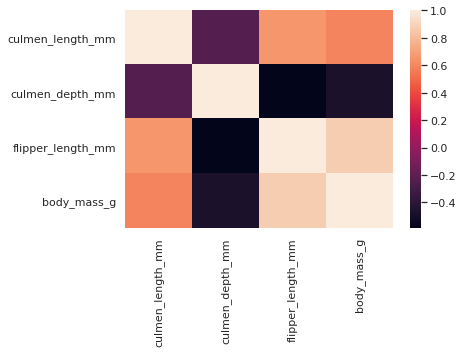

In [ ]:
sns.heatmap(penguins.corr())

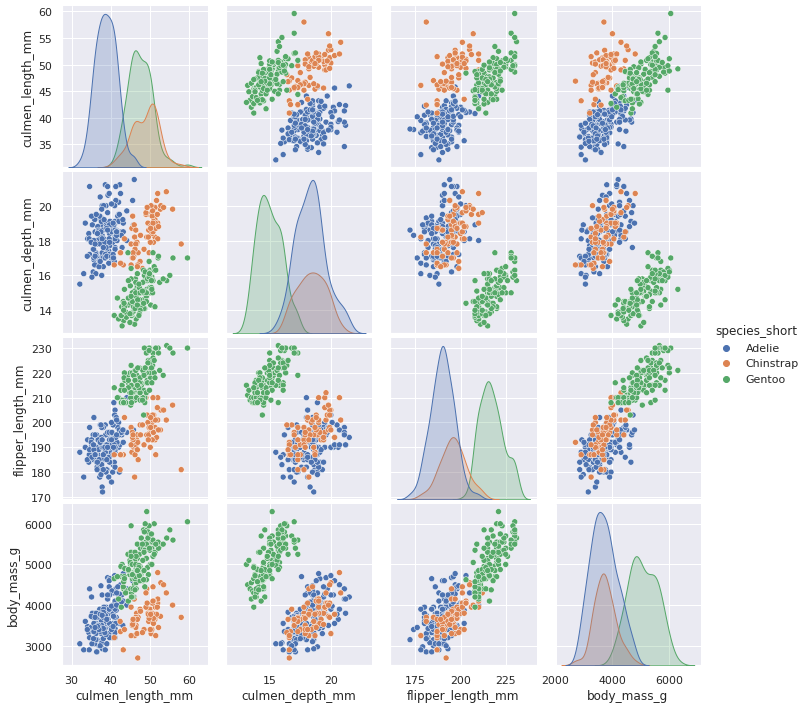

In [ ]:
sns.pairplot(penguins, hue='species_short')

In [ ]:
penguins.set_index('species_short', inplace=True)

In [ ]:
penguins_cleaned = penguins.select_dtypes(exclude=['object'])
penguins_cleaned.head()


,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g
species_short,,,,
Adelie,39.1,18.7,181.0,3750.0
Adelie,39.5,17.4,186.0,3800.0
Adelie,40.3,18.0,195.0,3250.0
Adelie,NaN,NaN,NaN,NaN
Adelie,36.7,19.3,193.0,3450.0


In [ ]:
from sklearn.preprocessing import StandardScaler

standardscaler = StandardScaler()

penguins_scaled = standardscaler.fit_transform(penguins_cleaned)



In [ ]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer()

penguins_scaled_imputed = imputer.fit_transform(penguins_scaled)


In [ ]:
print(penguins_scaled_imputed)

[[-0.88449874  0.78544923 -1.41834665 -0.56414208]
 [-0.81112573  0.1261879  -1.06225022 -0.50170305]
 [-0.66437972  0.43046236 -0.42127665 -1.18853234]
 ...
 [ 1.18828874 -0.73592307  1.50164406  1.93341896]
 [ 0.23443963 -1.19233476  0.7894512   1.24658968]
 [ 1.09657248 -0.53307343  0.86067049  1.49634578]]


In [ ]:
from sklearn.decomposition import PCA

myPCA = PCA() 

myPCA.fit(penguins_scaled_imputed)



PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [ ]:
penguins_reduced = myPCA.transform(penguins_scaled_imputed)

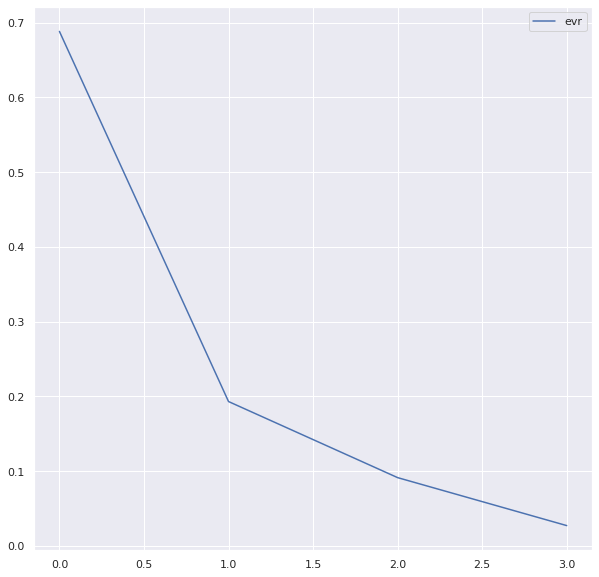

In [ ]:
plot_data = pd.DataFrame({'evr': myPCA.explained_variance_ratio_}).stack()
sns.set(rc={'figure.figsize':(10,10)})
sns.lineplot(y = plot_data.values, x = plot_data.index.get_level_values(0), hue=plot_data.index.get_level_values(1))

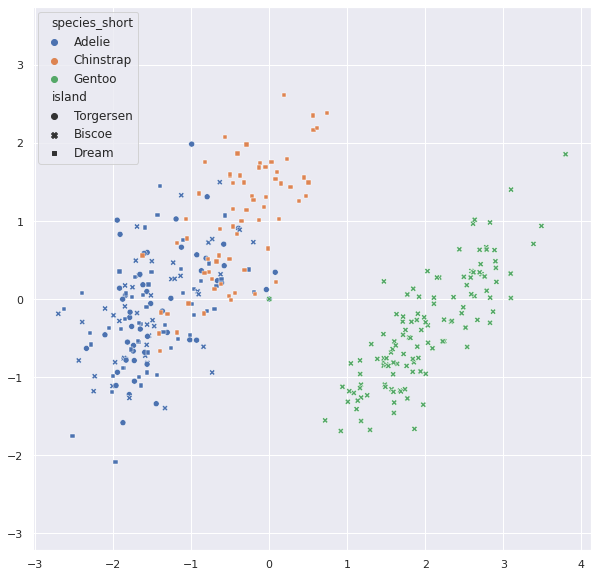

In [ ]:
import matplotlib.pyplot as plt 

sns.scatterplot(x = penguins_reduced[:,0], y = penguins_reduced[:,1],  hue = penguins_cleaned.index, style = penguins['island'] )
plt.axis('equal')
plt.show( )

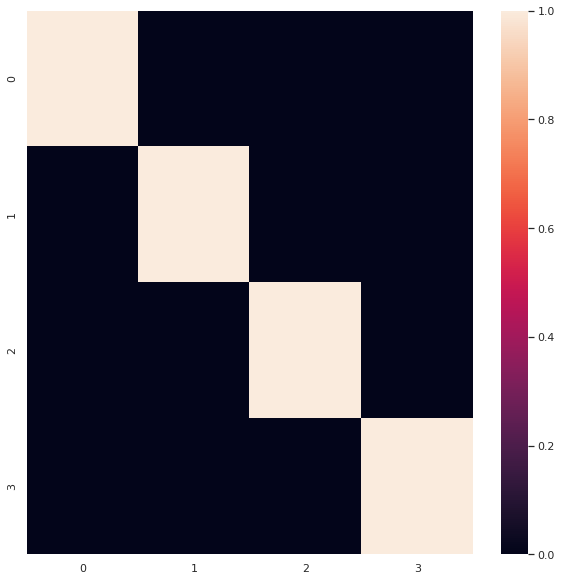

In [ ]:
sns.heatmap(pd.DataFrame(penguins_reduced).corr())

## Employee turnover

### The assignment

In the repo, you will find a dataset describing employee turnover in a company.

*https://raw.githubusercontent.com/CALDISS-AAU/sdsphd20/master/datasets/turnover.csv*

The dataset contains data collected in an employee survey and enriched with HR data.

The variable `churn` tells us if the employee left the company in the past 3 months. The other variables are collected

#### Classification

Try to predict `churn` using a classification pipeline (perhaps add some simple exploration of the data first)

#### Regression
Try to predict the number of weekly average hours worked.

**Before** working with the data, you should use `pd.get_dummies` to get dummies for categorical variables.

In [ ]:
import pandas as pd

data = pd.read_csv('https://raw.githubusercontent.com/CALDISS-AAU/sdsphd20/master/datasets/turnover.csv')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   satisfaction          14999 non-null  float64
 1   evaluation            14999 non-null  float64
 2   number_of_projects    14999 non-null  int64  
 3   average_montly_hours  14999 non-null  int64  
 4   time_spend_company    14999 non-null  int64  
 5   work_accident         14999 non-null  int64  
 6   churn                 14999 non-null  int64  
 7   promotion             14999 non-null  int64  
 8   department            14999 non-null  object 
 9   salary                14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


In [ ]:
X = data.loc[:, data.columns != 'churn']
Y = data.churn

In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

Y_enc = encoder.fit_transform(Y)


In [ ]:
X = pd.get_dummies(X, columns=['department', 'salary'])

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y_enc, test_size = 0.3, random_state = 123)

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(max_iter=2000)

In [ ]:
scores = cross_val_score(model, X_train, Y_train, cv = 5)
print(scores)

[0.78952381 0.7852381  0.79095238 0.79047619 0.78132444]


In [ ]:
model.fit(X_train, Y_train)
print(model.score(X_test, Y_test))

Y_pred = model.predict(X_test)
print(classification_report(Y_test, Y_pred)) #Print out the report

0.7897777777777778
              precision    recall  f1-score   support

           0       0.82      0.93      0.87      3429
           1       0.61      0.33      0.43      1071

    accuracy                           0.79      4500
   macro avg       0.71      0.63      0.65      4500
weighted avg       0.77      0.79      0.77      4500



In [ ]:
!pip install -qq -U mlxtend

     |████████████████████████████████| 1.4MB 5.5MB/s 


In [ ]:
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

(<Figure size 720x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7ff5f17cb048>)

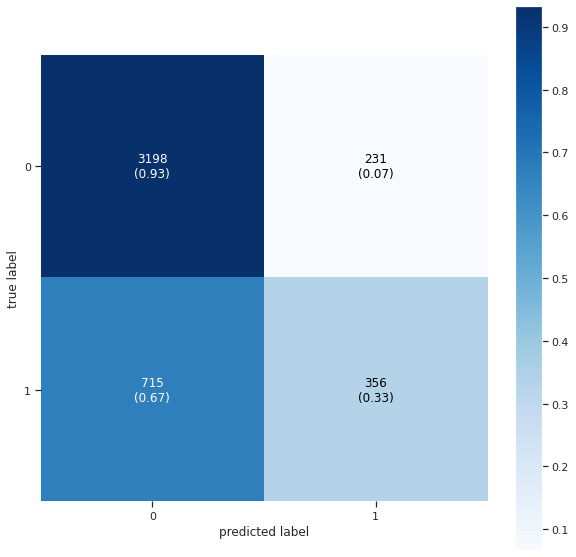

In [ ]:
confmatrix = confusion_matrix(Y_test,Y_pred) 

plot_confusion_matrix(conf_mat=confmatrix,
                                colorbar=True,
                                show_absolute=True,
                                show_normed=True,
                                hide_spines = True)

[0.97571429 0.97714286 0.97857143 0.97190476 0.97570272]
0.9717777777777777
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      3429
           1       0.96      0.92      0.94      1071

    accuracy                           0.97      4500
   macro avg       0.97      0.96      0.96      4500
weighted avg       0.97      0.97      0.97      4500



(<Figure size 720x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7ff5f16354a8>)

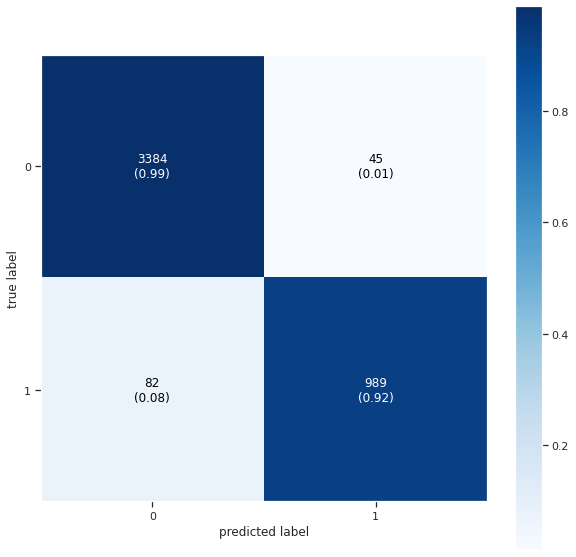

In [ ]:
import xgboost as xgb
model2 = xgb.XGBClassifier()
scores = cross_val_score(model2, X_train, Y_train, cv = 5)
print(scores)
model2.fit(X_train, Y_train)
print(model2.score(X_test, Y_test))
Y_pred = model2.predict(X_test)
print(classification_report(Y_test, Y_pred))
confmatrix = confusion_matrix(Y_test,Y_pred) 
plot_confusion_matrix(conf_mat=confmatrix,
                                colorbar=True,
                                show_absolute=True,
                                show_normed=True)

[0.98809524 0.98952381 0.98952381 0.98619048 0.98761315]
0.9902222222222222
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3429
           1       0.99      0.97      0.98      1071

    accuracy                           0.99      4500
   macro avg       0.99      0.98      0.99      4500
weighted avg       0.99      0.99      0.99      4500



(<Figure size 720x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7ff5e79c95c0>)

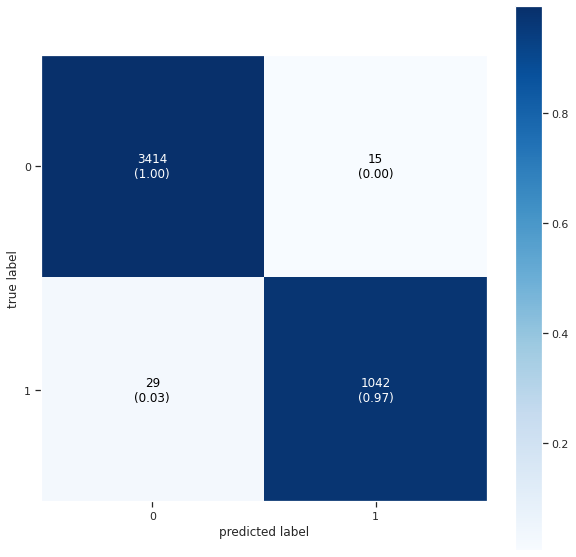

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model3 = RandomForestClassifier()
scores = cross_val_score(model3, X_train, Y_train, cv = 5)
print(scores)
model3.fit(X_train, Y_train)
print(model3.score(X_test, Y_test))
Y_pred = model3.predict(X_test)
print(classification_report(Y_test, Y_pred))
confmatrix = confusion_matrix(Y_test,Y_pred) 
plot_confusion_matrix(conf_mat=confmatrix,
                                colorbar=True,
                                show_absolute=True,
                                show_normed=True)

In [ ]:
X = data.loc[:, data.columns != 'average_montly_hours']
Y_reg = data.average_montly_hours

In [ ]:
X = pd.get_dummies(X, columns=['department', 'salary'])

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test, data_train, data_test = train_test_split(X_scaled, Y_reg, data, test_size = 0.3, random_state = 123)

In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

model.fit(X_train, Y_train)

print(model.score(X_test, Y_test))

0.23109983133330425


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


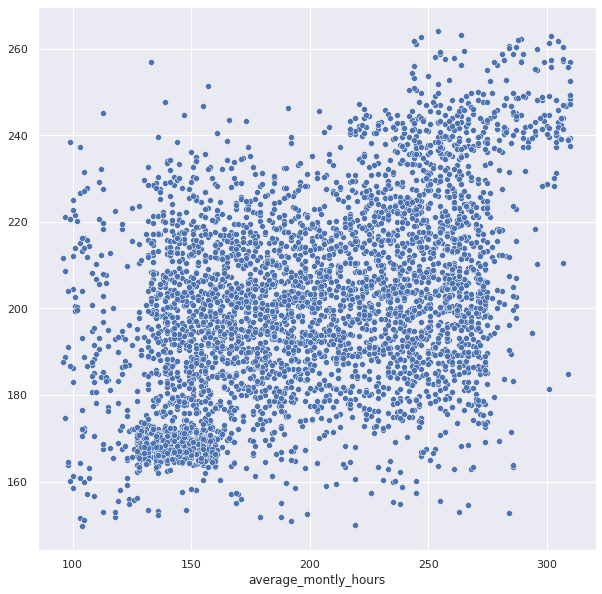

In [ ]:
Y_pred = model.predict(X_test)

import seaborn as sns
sns.scatterplot(Y_test,Y_pred)

In [ ]:
data_test['average_montly_hours_pred'] = Y_pred


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
data_test

,satisfaction,evaluation,number_of_projects,average_montly_hours,time_spend_company,work_accident,churn,promotion,department,salary,average_montly_hours_pred
6958,0.54,0.67,3,154,2,0,0,0,sales,high,185.444747
7534,0.72,0.52,3,143,4,1,0,0,support,low,174.975997
2975,0.95,0.61,3,267,2,0,0,0,RandD,low,181.585372
3903,0.78,0.79,3,203,2,0,0,0,sales,low,192.421310
8437,0.60,0.40,3,146,4,1,0,0,technical,low,168.671310
...,...,...,...,...,...,...,...,...,...,...,...
8001,0.84,0.66,4,204,3,0,0,0,IT,medium,201.390060
11630,0.68,0.67,4,162,10,0,0,0,management,high,205.167403
8163,0.57,0.69,3,154,2,0,0,0,RandD,low,183.499435
4063,0.64,0.85,5,179,2,0,0,0,sales,low,222.288497


In [ ]:

import altair as alt
alt.Chart(data_test).mark_circle(size=60).encode(
    x='average_montly_hours',
    y='average_montly_hours_pred',
    color=alt.Color('satisfaction', scale=alt.Scale(scheme='Magma'))).interactive()


alt.Chart(...)

In [ ]:
    alt.Chart(data_test).mark_circle(size=60).encode(
    x='average_montly_hours',
    y='average_montly_hours_pred',
    color=alt.Color('number_of_projects', scale=alt.Scale(scheme='Viridis'))).interactive()

alt.Chart(...)

In [ ]:
model = xgb.XGBRegressor()
model.fit(X_train, Y_train)
print(model.score(X_test, Y_test))

[10:20:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.34066158350707487


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


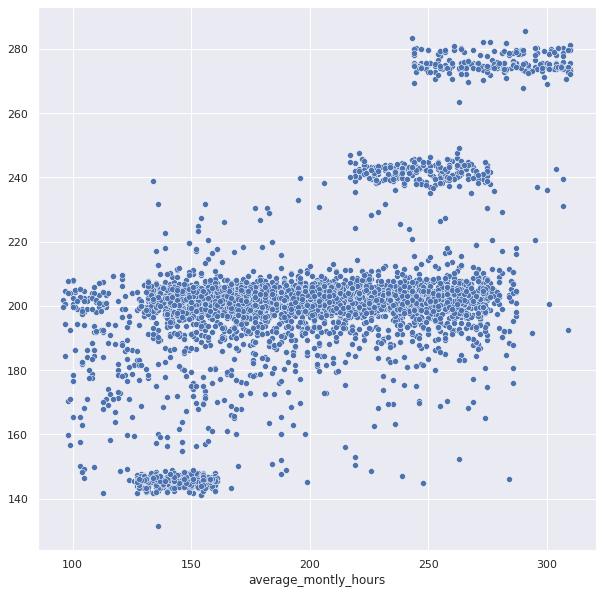

In [ ]:
Y_pred = model.predict(X_test)

sns.scatterplot(Y_test,Y_pred)

In [ ]:
data_test['average_montly_hours_pred'] = Y_pred

alt.Chart(data_test).mark_circle(size=60).encode(
    x='average_montly_hours',
    y='average_montly_hours_pred',
    color=alt.Color('satisfaction', scale=alt.Scale(scheme='Magma'))).interactive()


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


alt.Chart(...)

In [ ]:
    
    alt.Chart(data_test).mark_circle(size=60).encode(
    x='average_montly_hours',
    y='average_montly_hours_pred',
    color=alt.Color('number_of_projects', scale=alt.Scale(scheme='Viridis'))).interactive()

alt.Chart(...)

Now.. dont engage in less han 3 projects of more than 5 if you want to be satisfied

---

# Portfolio assignments for Wednesday

**Requirement:** Work on solutions for *either* the network analysis case study 1 or case study 2 *and* the exercise for spatial stuff.

## Network analysis: Case Study 1: Directed Networks: Friends & Foes at Work

### Introduction to the case

* Emmanuel Lazega, The Collegial Phenomenon: The Social Mechanisms of Cooperation Among Peers in a Corporate Law Partnership, Oxford University Press (2001).

#### Data 
This data set comes from a network study of corporate law partnership that was carried out in a Northeastern US corporate law firm, referred to as SG&R, 1988-1991 in New England. It includes (among others) measurements of networks among the 71 attorneys (partners and associates) of this firm, i.e. their strong-coworker network, advice network, friendship network, and indirect control networks. Various members' attributes are also part of the dataset, including seniority, formal status, office in which they work, gender, lawschool attended, individual performance measurements (hours worked, fees brought in), attitudes concerning various management policy options, etc. This dataset was used to identify social processes such as bounded solidarity, lateral control, quality control, knowledge sharing, balancing powers, regulation, etc. among peers.

#### Setting
* What do corporate lawyers do? Litigation and corporate work.
* Division of work and interdependencies.
* Three offices, no departments, built-in pressures to grow, intake and assignment rules.
* Partners and associates: hierarchy, up or out rule, billing targets.
* Partnership agreement (sharing benefits equally, 90% exclusion rule, governance structure, elusive committee system) and incompleteness of the contracts.
* Informal, unwritten rules (ex: no moonlighting, no investment in buildings, no nepotism, no borrowing to pay partners, etc.).
* Huge incentives to behave opportunistically ; thus the dataset is appropriate for the study of social processes that make cooperation among rival partners possible. 
* Sociometric name generators used to elicit coworkers, advice, and 'friendship' ties at SG&R:"Here is the list of all the members of your Firm."

The networks where created according to the follwoing questionaire:

* Strong coworkers network: "Because most firms like yours are also organized very informally, it is difficult to get a clear idea of how the members really work together. Think back over the past year, consider all the lawyers in your Firm. Would you go through this list and check the names of those with whom you have worked with. By "worked with" I mean that you have spent time together on at least one case, that you have been assigned to the same case, that they read or used your work product or that you have read or used their work product; this includes professional work done within the Firm like Bar association work, administration, etc."
* Basic advice network: "Think back over the past year, consider all the lawyers in your Firm. To whom did you go for basic professional advice? For instance, you want to make sure that you are handling a case right, making a proper decision, and you want to consult someone whose professional opinions are in general of great value to you. By advice I do not mean simply technical advice."
* 'Friendship' network:
"Would you go through this list, and check the names of those you socialize with outside work. You know their family, they know yours, for instance. I do not mean all the people you are simply on a friendly level with, or people you happen to meet at Firm functions." 

### Data preperation

#### Packages

In [ ]:
# Installing visualization packages
!pip install -U bokeh
!pip install -q holoviews

     |████████████████████████████████| 8.9MB 5.2MB/s 
     |████████████████████████████████| 2.2MB 49.0MB/s 
  Created wheel for bokeh: filename=bokeh-2.2.3-cp36-none-any.whl size=9296309 sha256=c9de77d9e867a17790ab7119fcb3dfd01e7909d131c567b9b2771673156691fe
  Stored in directory: /root/.cache/pip/wheels/dc/96/7b/9c9d48ed392511bc708e39580e18dc7a92f475795cd26b51bf
Successfully built bokeh
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0
  Found existing installation: bokeh 2.1.1
    Uninstalling bokeh-2.1.1:
      Successfully uninstalled bokeh-2.1.1


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import itertools # Python's amazing iteration & combination library
import networkx as nx

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
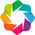

In [ ]:
# Visualization defaults
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')
from bokeh.plotting import show

# Setting the default figure size a bit larger
defaults = dict(width=750, height=750, padding=0.1,
                xaxis=None, yaxis=None)
hv.opts.defaults(
    opts.EdgePaths(**defaults), opts.Graph(**defaults), opts.Nodes(**defaults))

####  Load the data

Lets load the data! The three networks refer to cowork, friendship, and advice. The first 36 respondents are the partners in the firm.

(the cell belows reads in the tables, performs some recoding and cleanup and creates network objects for the 3 data sets).

In [ ]:
mat_friendship = pd.read_table("https://www.dropbox.com/s/0saiulir3pr566k/ELfriend.dat?dl=1", delim_whitespace=True, header=None) 
mat_advice = pd.read_table("https://www.dropbox.com/s/apq42n1grim23k9/ELadv.dat?dl=1", delim_whitespace=True, header=None) 
mat_work = pd.read_table("https://www.dropbox.com/s/dliz0sd7or8tv01/ELwork.dat?dl=1", delim_whitespace=True, header=None)

G_friendship = nx.from_pandas_adjacency(mat_friendship, create_using=nx.DiGraph)
G_advice = nx.from_pandas_adjacency(mat_advice, create_using=nx.DiGraph)
G_work = nx.from_pandas_adjacency(mat_work, create_using=nx.DiGraph)

attributes = pd.read_table("https://www.dropbox.com/s/qz7fvfgx8lvjgpr/ELattr.dat?dl=1", delim_whitespace=True, header=None, dtype='int') 
attributes=attributes.round().astype(int)
attributes.columns = ["id", "seniority", "gender", "office", "tenure", "age", "practice", "school"]
attributes.set_index('id',inplace=True)

cleanup_nums = {"seniority":     {1: "Partner", 2: "Associate"},
                "gender":     {1: "Male", 2: "Female"},
                "office":     {1: "Boston", 2: "Hartford", 3:"Providence"},
                "practice":     {1: "Litigation", 2: "Corporate"},
                "school":     {1: "Harvard, Yale", 2: "Ucon", 3: "Others"}
                } 
attributes.replace(cleanup_nums, inplace=True)

attributes_dict=attributes.T.to_dict()

nx.set_node_attributes(G_friendship, attributes_dict)
nx.set_node_attributes(G_advice, attributes_dict)
nx.set_node_attributes(G_work, attributes_dict)

print(nx.get_node_attributes(G_friendship, 'seniority'))

{1: 'Partner', 2: 'Partner', 3: 'Partner', 4: 'Partner', 5: 'Partner', 6: 'Partner', 7: 'Partner', 8: 'Partner', 9: 'Partner', 10: 'Partner', 11: 'Partner', 12: 'Partner', 13: 'Partner', 14: 'Partner', 15: 'Partner', 16: 'Partner', 17: 'Partner', 18: 'Partner', 19: 'Partner', 20: 'Partner', 21: 'Partner', 22: 'Partner', 23: 'Partner', 24: 'Partner', 25: 'Partner', 26: 'Partner', 27: 'Partner', 28: 'Partner', 29: 'Partner', 30: 'Partner', 31: 'Partner', 32: 'Partner', 33: 'Partner', 34: 'Partner', 35: 'Partner', 36: 'Partner', 37: 'Associate', 38: 'Associate', 39: 'Associate', 40: 'Associate', 41: 'Associate', 42: 'Associate', 43: 'Associate', 44: 'Associate', 45: 'Associate', 46: 'Associate', 47: 'Associate', 48: 'Associate', 49: 'Associate', 50: 'Associate', 51: 'Associate', 52: 'Associate', 53: 'Associate', 54: 'Associate', 55: 'Associate', 56: 'Associate', 57: 'Associate', 58: 'Associate', 59: 'Associate', 60: 'Associate', 61: 'Associate', 62: 'Associate', 63: 'Associate', 64: 'Asso

#### Calculate dimensional centralities

There might be better ways to do that (still experimenting), but for now lets first create centralities upfront for all networks. We for now only look at the in-degree.

In [ ]:
cent_degree_friendship = dict(G_friendship.in_degree)
cent_degree_advice = dict(G_advice.in_degree)
cent_degree_work = dict(G_work.in_degree)

In [ ]:
nx.set_node_attributes(G_friendship, cent_degree_friendship, 'cent_degree')
nx.set_node_attributes(G_advice, cent_degree_advice, 'cent_degree')
nx.set_node_attributes(G_work, cent_degree_work, 'cent_degree')

In [ ]:
# Create and save a layout.
G_layout = nx.layout.kamada_kawai_layout(G_work)

In [ ]:
g_plot = hv.Graph.from_networkx(G_friendship, G_layout).opts(tools=['hover'],
                                                                        directed=True,
                                                                        edge_alpha=0.25,
                                                                        node_size='cent_degree',
                                                                        #node_color='seniority', cmap='Set1',
                                                                        legend_position='right'
                                                                        )

show(hv.render(g_plot))

In [ ]:
g_plot = hv.Graph.from_networkx(G_advice, G_layout).opts(tools=['hover'],
                                                                        directed=True,
                                                                        edge_alpha=0.25,
                                                                        node_size='cent_degree',
                                                                        #node_color='cent_degree', cmap='Set1',
                                                                        legend_position='right')
show(hv.render(g_plot))

In [ ]:
g_plot = hv.Graph.from_networkx(G_work, G_layout).opts(tools=['hover'],
                                                                        directed=True,
                                                                        edge_alpha=0.25,
                                                                        node_size='cent_degree',
                                                                        #node_color='seniority', cmap='Set1',
                                                                        legend_position='right')
show(hv.render(g_plot))

#### Assortiativity

We can also calculate another interested measure, particularly in social networks: Assortiativity. In a nutshell, it measures if two nodes that share certain characteristics ahve a higher or lower probability to be connected.

For details, check:

* Newman, M. E. J. (27 February 2003). "Mixing patterns in networks". Physical Review E. American Physical Society (APS). 67 (2): 026126

In [ ]:
nx.attribute_assortativity_coefficient(G_friendship, 'seniority')

0.5354650209260934

In [ ]:
nx.attribute_assortativity_coefficient(G_friendship, 'school')

0.019171775624653154

In [ ]:
nx.attribute_assortativity_coefficient(G_friendship, 'office')

0.03651083062621142

#### Reciprocity

Anotyher interesting question usually is, if directed edges are reciptocated, meaning that an edge between `i,j` makes an edge between `j,i` more likely

In [ ]:
nx.overall_reciprocity(G_friendship)

0.6121739130434782

### The assignment

Explore the network further.

1. Calculate the reciprocity for the work and advise network. Are the numbers diffetrent? Why might that be the case?
2. Identify communities in the friendship and advice network (hint: works only on undirected networks, so you might have to create an undirected graph)
3. Visualize these communities (static or dynamic)

In [ ]:
nx.overall_reciprocity(G_advice)

0.3923766816143498

In [ ]:
nx.overall_reciprocity(G_work)

1.0

The numbers are different because all works together, but that does not mean that one takes/needs everyones advice

In [ ]:
import community

In [ ]:
nx.get_edge_attributes(G_work, 'weight')

{(0, 16): 1,
 (0, 38): 1,
 (0, 39): 1,
 (0, 40): 1,
 (1, 6): 1,
 (1, 15): 1,
 (1, 16): 1,
 (1, 21): 1,
 (1, 25): 1,
 (1, 28): 1,
 (1, 43): 1,
 (1, 52): 1,
 (1, 61): 1,
 (1, 63): 1,
 (2, 17): 1,
 (2, 24): 1,
 (2, 27): 1,
 (3, 11): 1,
 (3, 16): 1,
 (3, 18): 1,
 (3, 19): 1,
 (3, 21): 1,
 (3, 25): 1,
 (3, 27): 1,
 (3, 28): 1,
 (3, 30): 1,
 (3, 36): 1,
 (3, 39): 1,
 (3, 44): 1,
 (3, 45): 1,
 (3, 51): 1,
 (3, 60): 1,
 (3, 61): 1,
 (3, 69): 1,
 (4, 17): 1,
 (4, 23): 1,
 (4, 27): 1,
 (4, 30): 1,
 (4, 31): 1,
 (4, 32): 1,
 (4, 37): 1,
 (4, 38): 1,
 (4, 49): 1,
 (4, 50): 1,
 (4, 53): 1,
 (4, 57): 1,
 (4, 58): 1,
 (4, 62): 1,
 (5, 23): 1,
 (5, 27): 1,
 (5, 29): 1,
 (5, 30): 1,
 (5, 31): 1,
 (5, 37): 1,
 (5, 42): 1,
 (5, 50): 1,
 (5, 57): 1,
 (5, 58): 1,
 (5, 62): 1,
 (5, 64): 1,
 (6, 1): 1,
 (6, 17): 1,
 (6, 62): 1,
 (8, 11): 1,
 (8, 15): 1,
 (8, 28): 1,
 (8, 44): 1,
 (8, 59): 1,
 (9, 23): 1,
 (9, 25): 1,
 (9, 28): 1,
 (9, 30): 1,
 (9, 33): 1,
 (9, 48): 1,
 (9, 52): 1,
 (9, 59): 1,
 (10, 16): 1,


In [ ]:
for n1, n2, d in G_work.edges(data=True):
  d.pop('weight', None)

In [ ]:
com = community.best_partition(G_work.to_undirected())

In [ ]:
max(com.values())

3

In [ ]:
nx.set_node_attributes(G_work, com, 'community')

g_plot = hv.Graph.from_networkx(G_work, G_layout).opts(tools=['hover'],node_size='cent_degree',  node_color='community', cmap=plt.cm.Set1,legend_position='right')

show(hv.render(g_plot))

In [ ]:
nx.get_edge_attributes(G_advice, 'weight')

for n1, n2, d in G_advice.edges(data=True):
  d.pop('weight', None)

com = community.best_partition(G_advice.to_undirected())

max(com.values())

2

In [ ]:
nx.set_node_attributes(G_advice, com, 'community')

g_plot = hv.Graph.from_networkx(G_advice, G_layout).opts(tools=['hover'],
                                                  node_size='cent_degree', 
                                                  node_color='community', cmap=plt.cm.Set1,
                                                  legend_position='right')

show(hv.render(g_plot))

## Exercise for spatial stuff

So, now I have a better hypothesis; mental health has something to do with noise!

Here, you find a new geo-dataset;

- OPEN_DATA_STOEJDATA_VIEWPoint.shp

This contains information about noise at different places within municipalities. The end goal is to create a map where each point is aggregated to municipality level and we visualize where the noise is more severe. We use the column "GNSHAST071" to measure average noice at that point.

When that map is done, create a pretty map with the mental health measurement and compare the two - are there any connection between noise at an aggregated level and mental health?

Feel free to play around with types of basemaps, types of colors and all sorts of things - the goal is not to become the leading expert in making fancy maps but to have fun and learn stuff.

In [ ]:
!pip install geopandas # geopandas is not installed by default on Colab - this installs it
!pip install contextily # contextily is not installed by default on Colab - this installs it
!pip install pygeos # pygeos optional dependency for geopandas (which we will use)


!wget "https://github.com/CALDISS-AAU/sdsphd20/raw/master/notebooks/wed25/Shapefiles/shapefiles_exercise.zip"
!unzip shapefiles_exercise.zip


import geopandas as gdp
import pandas as pd
import matplotlib.pyplot as plt
from pyproj import Proj
import contextily as ctx


stoejdata = gdp.read_file("OPEN_DATA_STOEJDATA_VIEWPoint.shp")

     |████████████████████████████████| 972kB 4.3MB/s 
     |████████████████████████████████| 6.5MB 12.4MB/s 
     |████████████████████████████████| 14.8MB 156kB/s 
     |████████████████████████████████| 18.3MB 263kB/s 
     |████████████████████████████████| 1.6MB 4.2MB/s 
--2020-12-10 10:21:19--  https://github.com/CALDISS-AAU/sdsphd20/raw/master/notebooks/wed25/Shapefiles/shapefiles_exercise.zip
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/CALDISS-AAU/sdsphd20/master/notebooks/wed25/Shapefiles/shapefiles_exercise.zip [following]
--2020-12-10 10:21:19--  https://raw.githubusercontent.com/CALDISS-AAU/sdsphd20/master/notebooks/wed25/Shapefiles/shapefiles_exercise.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubuserconte

/usr/local/lib/python3.6/dist-packages/geopandas/_compat.py:88: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.8.1-CAPI-1.13.3). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [ ]:
stoejdata.head()

,DATAEJER,VEJBESTYRE,VEJNR,VEJDEL,VEJNAVN,KILOMETER,METER,LOKATION,KOMMUNE,AAR,AADT,TIMEANTAL0,TIMEANTAL1,TIMEANTAL2,GNSHAST07_,GNSHAST19_,GNSHAST22_,TIMEANTAL3,TIMEANTAL4,TIMEANTAL5,GNSHAST070,GNSHAST190,GNSHAST220,TIMEANTAL6,TIMEANTAL7,TIMEANTAL8,GNSHAST071,GNSHAST191,GNSHAST221,TIMEANTAL9,TIMEANTA10,TIMEANTA11,GNSHAST072,GNSHAST192,GNSHAST222,geometry
0,316,316.0,3161633.0,0,"Søstrupvej, 4300 Holbæk",1.0,830.0,Søstrupvej ca. 170 m fra nr. 19,316.0,2019.0,2720.0,192.0,79.0,19.0,59.9,61.6,62.0,187.0,79.0,19.0,60.3,61.8,62.6,4.0,1.0,0.0,54.5,54.9,53.8,NaN,NaN,NaN,50.0,NaN,50.7,POINT (666785.000 6174847.000)
1,316,316.0,300602.0,0,Slagelse-Snertinge,26.0,640.0,Ved Bromøllekro,316.0,2019.0,4765.0,300.0,129.0,87.0,58.3,60.3,62.5,282.0,125.0,82.0,58.4,60.4,62.6,10.0,4.0,3.0,56.3,57.7,60.7,7.0,2.0,3.0,57.0,55.5,61.0,POINT (650362.000 6165481.000)
2,316,316.0,300143.0,0,Elverdam-Ugerløse,7.0,420.0,Øst for 187,316.0,2019.0,2605.0,169.0,85.0,36.0,42.0,42.1,44.5,160.0,83.0,34.0,42.4,42.4,45.0,6.0,2.0,1.0,38.6,37.7,40.8,2.0,1.0,1.0,38.7,39.0,39.6,POINT (670888.000 6165624.000)
3,316,316.0,300143.0,0,Elverdam-Ugerløse,1.0,656.0,Udfor P-Lomme,316.0,2019.0,3012.0,194.0,100.0,43.0,77.4,78.4,80.9,189.0,100.0,42.0,77.8,78.6,81.1,3.0,1.0,1.0,71.4,73.9,78.2,1.0,0.0,0.0,66.2,77.4,74.1,POINT (675622.000 6167385.000)
4,316,316.0,300143.0,0,Elverdam-Ugerløse,11.0,100.0,Øst for 346,316.0,2019.0,2087.0,134.0,68.0,30.0,63.7,65.8,68.0,127.0,67.0,28.0,64.2,66.4,69.0,4.0,1.0,1.0,59.3,60.1,60.0,2.0,2.0,1.0,57.4,55.4,58.7,POINT (668085.000 6163679.000)


In [ ]:
stoejdata2 = stoejdata.dissolve(by='KOMMUNE')

In [ ]:
stoejdata2.head()

,geometry,DATAEJER,VEJBESTYRE,VEJNR,VEJDEL,VEJNAVN,KILOMETER,METER,LOKATION,AAR,AADT,TIMEANTAL0,TIMEANTAL1,TIMEANTAL2,GNSHAST07_,GNSHAST19_,GNSHAST22_,TIMEANTAL3,TIMEANTAL4,TIMEANTAL5,GNSHAST070,GNSHAST190,GNSHAST220,TIMEANTAL6,TIMEANTAL7,TIMEANTAL8,GNSHAST071,GNSHAST191,GNSHAST221,TIMEANTAL9,TIMEANTA10,TIMEANTA11,GNSHAST072,GNSHAST192,GNSHAST222
KOMMUNE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,"MULTIPOINT (476940.000 6156176.000, 477251.000...",0,0.0,417.0,0,Viborg - Holstebro,45.0,425.0,mellem Hodsagervej og TSA20,2018.0,7357.0,497.0,185.0,93.0,73.0,75.9,76.3,470.0,181.0,85.0,73.3,76.1,76.8,14.0,3.0,4.0,70.5,72.6,73.1,14.0,2.0,4.0,67.8,65.5,66.9
101.0,"MULTIPOINT (718424.001 6179111.000, 718432.001...",101,101.0,1016236.0,0,Skt. Gertruds Stræde,0.0,35.0,"ved nr. 3, midt ml. Kultorvet og Rosenborggade",2018.0,165.0,11.0,4.0,3.0,17.7,18.8,23.3,10.0,5.0,2.0,17.9,19.1,23.9,1.0,0.0,0.0,16.6,16.1,18.7,5.0,1.0,0.0,14.2,17.5,24.0
147.0,"MULTIPOINT (719699.001 6175815.000, 719883.001...",147,147.0,1470148.0,0,Dalgas Boulevard,1.0,500.0,Nord for Spurveskjul,2019.0,6752.0,471.0,196.0,58.0,36.7,39.0,39.6,427.0,186.0,51.0,36.7,39.0,39.7,41.0,10.0,6.0,36.6,39.1,38.5,2.0,0.0,0.0,33.9,32.5,33.6
151.0,"MULTIPOINT (705335.001 6183496.000, 706110.001...",0,0.0,111.0,0,Ring 4,10.0,390.0,Vest for Klausdalsbrovej (2017),2020.0,21607.0,1443.0,554.0,292.0,58.7,66.1,63.5,1282.0,518.0,248.0,58.9,66.3,64.1,123.0,27.0,32.0,57.9,64.8,61.3,33.0,8.0,10.0,52.9,56.4,58.0
153.0,"MULTIPOINT (713625.001 6171454.000, 713793.001...",0,0.0,3.0,0,Motorring 3,51.0,40.0,Mellem Roskildevej og Holbækmv. Sydgående. (op...,2019.0,116145.0,7263.0,3672.0,1997.0,95.6,109.6,103.0,6611.0,3458.0,1771.0,96.6,110.6,104.8,462.0,132.0,146.0,87.1,97.7,92.2,190.0,82.0,80.0,79.5,85.1,82.6


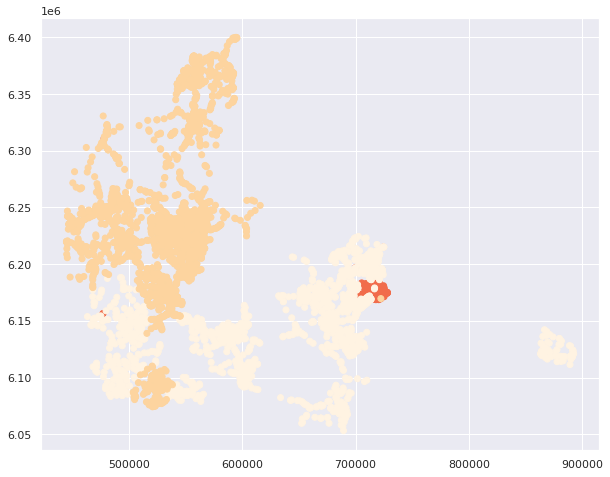

In [ ]:
stoejdata2.plot(column = 'GNSHAST071', figsize=(10,10), cmap='OrRd')

In [ ]:
!wget "https://github.com/CALDISS-AAU/sdsphd20/raw/master/notebooks/wed25/Shapefiles/shapefiles.zip" # Downloads data files
!unzip shapefiles.zip # Unpacks data files

municipalities = gdp.read_file("KOMMUNE.shp")


--2020-12-10 10:21:23--  https://github.com/CALDISS-AAU/sdsphd20/raw/master/notebooks/wed25/Shapefiles/shapefiles.zip
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/CALDISS-AAU/sdsphd20/master/notebooks/wed25/Shapefiles/shapefiles.zip [following]
--2020-12-10 10:21:23--  https://raw.githubusercontent.com/CALDISS-AAU/sdsphd20/master/notebooks/wed25/Shapefiles/shapefiles.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 32728265 (31M) [application/zip]
Saving to: ‘shapefiles.zip’

shapefiles.zip      100%[===================>]  31.21M  55.0MB/s    in 0.6s    

2020-12-10 10:21:24 (55.0 MB/s) - ‘shap

In [ ]:
municipalities.head()

,FEAT_ID,FEAT_KODE,FEAT_TYPE,FEAT_STTXT,GEOM_STTXT,DAGI_ID,AREAL,REGIONKODE,REGIONNAVN,GYLDIG_FRA,GYLDIG_TIL,KOMKODE,KOMNAVN,DQ_SPECIFK,DQ_STATEM,DQ_DESCR,DQ_PROCESS,DQ_RESPONS,DQ_POSACPL,DQ_POSACLV,TIMEOF_CRE,TIMEOF_PUB,TIMEOF_REV,TIMEOF_EXP,geometry
0,149673,6310,Kommune,vedtaget,endelig,389146,24010.29,1085,Region Sjælland,2019-01-01,None,0350,Lejre,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2019-01-01,2019-01-07,None,2020-11-07,"POLYGON Z ((675926.480 6172129.210 -999.000, 6..."
1,149674,6310,Kommune,vedtaget,endelig,389146,24010.29,1085,Region Sjælland,2019-01-01,None,0350,Lejre,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2019-01-01,2019-01-07,None,2020-11-07,"POLYGON Z ((687523.890 6176458.950 -999.000, 6..."
2,149675,6310,Kommune,vedtaget,endelig,389146,24010.29,1085,Region Sjælland,2019-01-01,None,0350,Lejre,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2019-01-01,2019-01-07,None,2020-11-07,"POLYGON Z ((689361.510 6173523.720 -999.000, 6..."
3,149676,6310,Kommune,vedtaget,endelig,389146,24010.29,1085,Region Sjælland,2019-01-01,None,0350,Lejre,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2019-01-01,2019-01-07,None,2020-11-07,"POLYGON Z ((689210.210 6174589.210 -999.000, 6..."
4,149647,6310,Kommune,vedtaget,endelig,389130,25096.56,1084,Region Hovedstaden,2018-01-22,None,0250,Frederikssund,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2018-01-22,2018-01-22,None,2020-11-07,"POLYGON Z ((679613.660 6187623.990 -999.000, 6..."


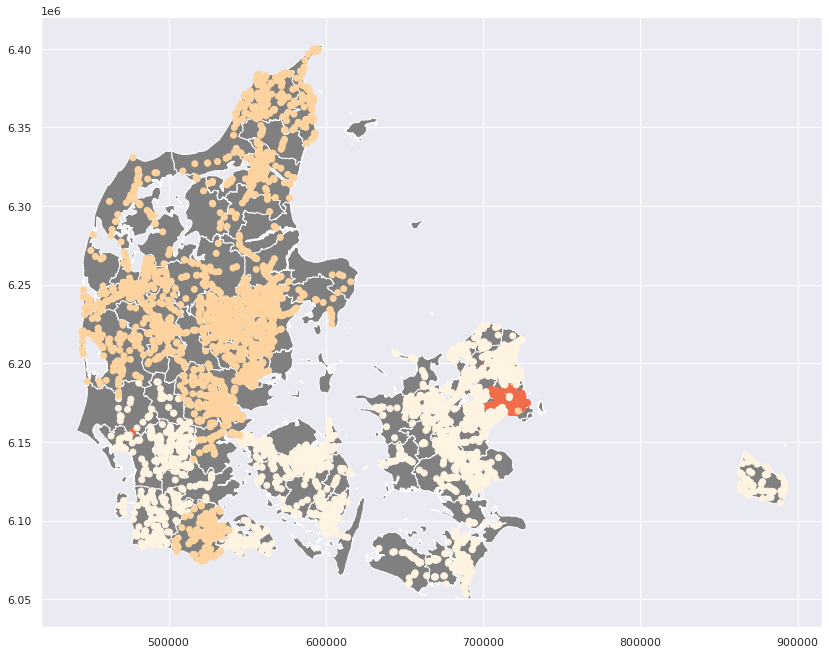

In [ ]:
fig, ax =plt.subplots(1,1, figsize=(14,14))
municipalities.plot(ax=ax, color = 'gray')
stoejdata2.plot(ax=ax, column = 'GNSHAST071', figsize=(10,10), cmap='OrRd')

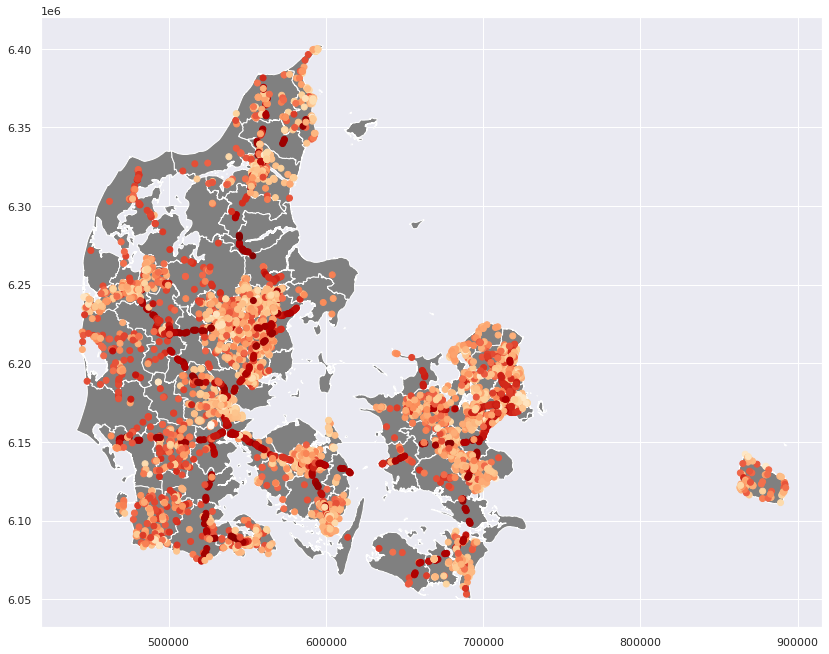

In [ ]:
fig, ax =plt.subplots(1,1, figsize=(14,14))
municipalities.plot(ax=ax, color = 'gray')
stoejdata.plot(ax=ax, column = 'GNSHAST071', figsize=(10,10), cmap='OrRd')

In [ ]:
mun_data=pd.read_excel("https://github.com/CALDISS-AAU/sdsphd20/raw/master/datasets/spatialdata.xlsx")
mun_data.head()

mun = municipalities.dissolve(by='KOMNAVN')
mun_fun = mun.merge(mun_data, left_on='KOMNAVN', right_on="omr", how='left', validate="one_to_one")
mun_fun.head()

,geometry,FEAT_ID,FEAT_KODE,FEAT_TYPE,FEAT_STTXT,GEOM_STTXT,DAGI_ID,AREAL,REGIONKODE,REGIONNAVN,GYLDIG_FRA,GYLDIG_TIL,KOMKODE,DQ_SPECIFK,DQ_STATEM,DQ_DESCR,DQ_PROCESS,DQ_RESPONS,DQ_POSACPL,DQ_POSACLV,TIMEOF_CRE,TIMEOF_PUB,TIMEOF_REV,TIMEOF_EXP,omr,alt2016,psyk2016,psykratio
0,MULTIPOLYGON Z (((532611.300 6079233.260 -999....,91071,6310,Kommune,vedtaget,endelig,389169,94061.45,1083,Region Syddanmark,2020-06-09,None,0580,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2020-06-09,2020-06-09,None,2020-11-07,Aabenraa,7016.0,109.0,0.015536
1,MULTIPOLYGON Z (((577131.740 6306752.540 -999....,149920,6310,Kommune,vedtaget,endelig,389206,113800.07,1081,Region Nordjylland,2018-11-07,None,0851,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2018-11-07,2018-11-07,None,2020-11-07,Aalborg,18343.0,340.0,0.018536
2,MULTIPOLYGON Z (((580132.510 6230146.780 -999....,150803,6310,Kommune,vedtaget,endelig,389194,47115.23,1082,Region Midtjylland,2018-06-28,None,0751,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2018-06-28,2018-06-28,None,2020-11-07,Aarhus,28614.0,472.0,0.016495
3,"POLYGON Z ((711377.280 6178342.550 -999.000, 7...",108994,6310,Kommune,vedtaget,endelig,389112,2343.66,1084,Region Hovedstaden,2020-08-27,None,0165,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2020-08-27,2020-08-27,None,2020-11-07,Albertslund,3686.0,76.0,0.020619
4,"POLYGON Z ((701094.650 6192181.200 -999.000, 7...",151461,6310,Kommune,vedtaget,endelig,389121,6742.52,1084,Region Hovedstaden,2018-01-22,None,0201,DS_DAGI_v1.0_REF,Digitaliseret pba. referencemateriale,Manuelt indtegnet pba. FOT/matriklen,SDFE,Social- og Indenrigsministeriet,1,None,2018-01-22,2018-01-22,None,2020-11-07,Allerød,2902.0,27.0,0.009304


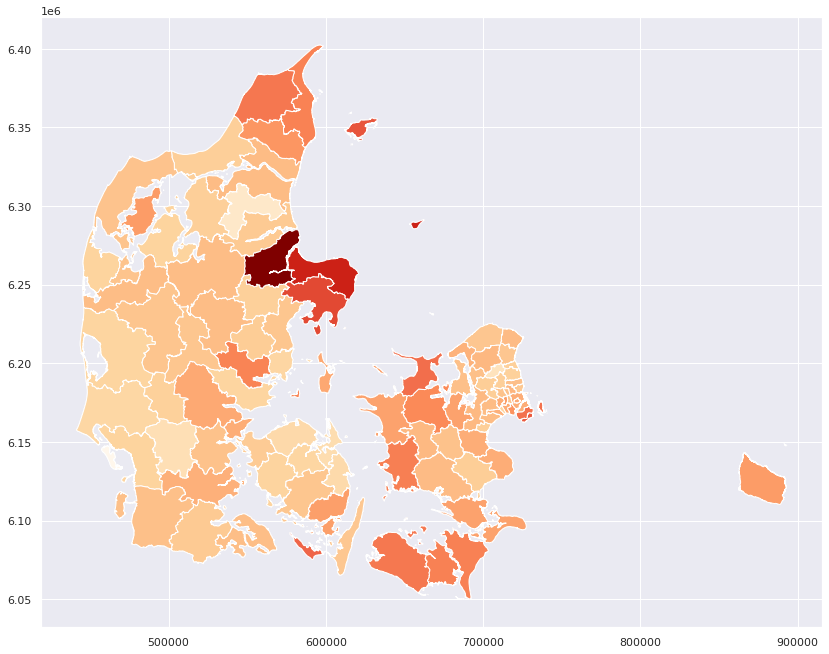

In [ ]:
fig, ax =plt.subplots(1,1, figsize=(14,14))
municipalities.plot(ax=ax, color = 'gray')
mun_fun.plot(ax=ax, column = 'psykratio', figsize=(10,10), cmap='OrRd')

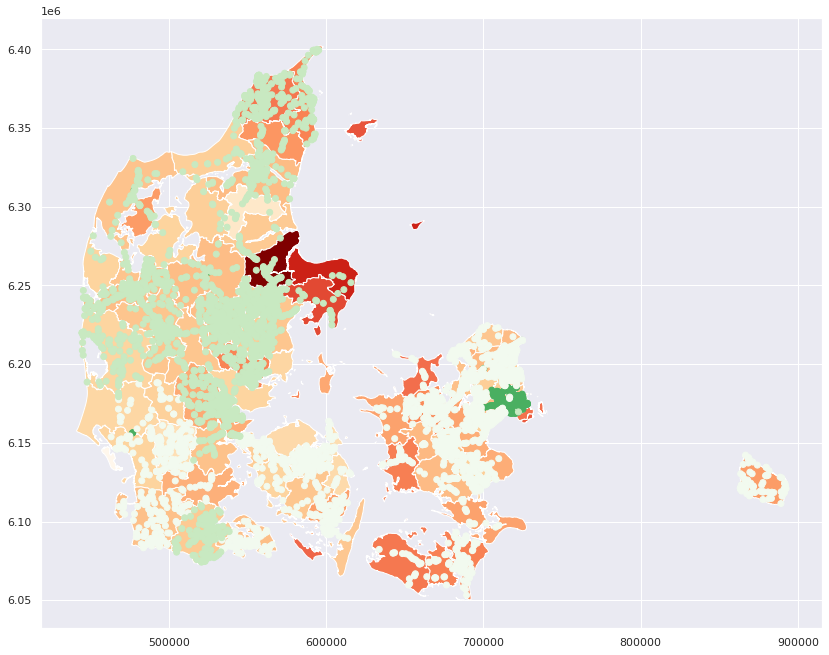

In [ ]:
fig, ax =plt.subplots(1,1, figsize=(14,14))
mun_fun.plot(ax=ax, column = 'psykratio', figsize=(10,10), cmap='OrRd')
stoejdata2.plot(ax=ax, column = 'GNSHAST071', figsize=(10,10), cmap='Greens')

Randers and Djursland seems have a high psykratio. Maybe they are depressed due to lack of cars



# Portfolio assignments for Thursday

**Requirement:** Work on solutions for the "Trump vs. GPT-2" assignment

## NLP: Trump vs. GPT-2

The site [https://faketrump.ai/](https://faketrump.ai/) WAS an interesting example of AI-powered fake-text generation. They wrote in 2019:

>We built an artificial intelligence model by fine-tuning [GPT-2](https://openai.com/blog/better-language-models/) to generate tweets in the style of Donald Trump’s Twitter account. After seeing the results, we also built a discriminator that can accurately detect fake tweets 77% of the time — think you can beat our classifier? Try it yourself!

Unfortunately, they decided to take down the site and the dataset.

GPT-2 is a neural transformer-based model, that has been announced by OpenAI in February 2019 and created considerable discussion because they decided - in contrast to their earlier policies - not to release the mode to the public. Their central argument was that the model could be used to produce fake news, spam and alike too easily. The footnote of the faketrump page reads: “Generating realistic fake text has become much more accessible. We hope to highlight the current state of text generation to demonstrate how difficult it is to discern fiction from reality.”


Since then several organizations and researchers have shown that it is [possible to develop systems to detect “fake text”](https://www.theguardian.com/technology/2019/jul/04/ai-fake-text-gpt-2-concerns-false-information). We believe that you too can implement a competitive system.

Having no dataset from that project, Roman decided to retrain GPT2 to generate new fake trump tweets. If they can do that, we can do that! However, it seems as if it is easier for ML models to identify our fake tweets...well...they are an AI company and probably spent more time on that...

> I’ve just watched Democrats scream over and over again about trying to Impeach the President of the United States. The Impeachment process is a sham.

> The Media must understand!“The New York Times is the leader on a very important subject: How to Combat Trump.” @foxandfriendsSo pathetic! @foxandfriendsI don’t think so.

> He is going to do it soon, and with proper borders. Border security is my top priority.The Democrats have failed the people of Arizona in everything else they have done, even their very good immigration laws. They have no sense.

The data can be found [here](https://github.com/SDS-AAU/SDS-master/raw/e2c959494d53859c1844604bed09a28a21566d0f/M3/assignments/trump_vs_GPT2.gz) and has the following format:


<table>
  <tr>
   <td>0
   </td>
   <td>1
   </td>
  </tr>
  <tr>
   <td>string
   </td>
   <td>boolean
   </td>
  </tr>
</table>

There are 7368 real Trump tweet and 7368 fake ones.

you can open it with:



```
data = pd.read_json('https://github.com/SDS-AAU/SDS-master/raw/e2c959494d53859c1844604bed09a28a21566d0f/M3/assignments/trump_vs_GPT2.gz')
```



* Split the data and preprocess it, vectorizing the text using different approaches (BoW, TFIDF, LSI)

* Create a system that can identify the fake Trump tweets using LogisticRefression or other classifiers (Sklearn - If you like also more complex models with FastAI, Keras neural nets or alike)

* Explore a subset (~1000) of the real and fake tweets using LDA and visualize your exploration

* Consider exploring using a different approach (LSI + clustering) or perhaps even [CorEx](https://github.com/gregversteeg/corex_topic)

In [ ]:
!pip -q install eli5 #installing a great package for explaining ML models
import pandas as pd
import numpy as np

     |████████████████████████████████| 112kB 4.3MB/s 


In [ ]:
data = pd.read_json('https://github.com/SDS-AAU/SDS-master/raw/e2c959494d53859c1844604bed09a28a21566d0f/M3/assignments/trump_vs_GPT2.gz')
data.head()

,0,1
0,I was thrilled to be back in the Great city of...,True
1,The Unsolicited Mail In Ballot Scam is a major...,True
2,"As long as I am President, I will always stand...",True
3,"Our Economy is doing great, and is ready to se...",True
4,If I do not sound like a typical Washington po...,True


In [ ]:
from sklearn.model_selection import train_test_split



In [ ]:
X = data[0].values
y = data[1].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=18)

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
X_train_vec_1 = vectorizer.fit_transform(X_train)

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(max_iter=2000)
model.fit(X_train_vec_1, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=2000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
X_test_vec_1 = vectorizer.transform(X_test)
model.score(X_test_vec_1, y_test)

0.8059701492537313

In [ ]:
y_pred = model.predict(X_test_vec_1)
pd.crosstab(y_test, y_pred)

col_0,False,True
row_0,,
False,1180,309
True,263,1196


In [ ]:
import spacy
nlp = spacy.load("en")
